In [1]:
import tensorflow as tf
from tensorflow import keras
from keras import layers
from keras import models
from keras.models import *
from keras.layers import *
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np

gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_memory_growth(gpus[0], True)
        tf.config.experimental.set_virtual_device_configuration(
            gpus[0],
            [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=3830)])
    except RuntimeError as e:
        print(e)

2024-05-22 13:02:02.411411: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9373] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-22 13:02:02.412890: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-22 13:02:02.671942: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1534] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-22 13:02:03.109326: I tensorflow/core/platform/cpu_feature_guard.cc:183] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE3 SSE4.1 SSE4.2 AVX, in other operations, rebuild TensorFlow with the appropriate compiler flags.
/usr/local/lib/python3.10/dist-packages

In [2]:
# Load train, validation and test datasets
train_original, train_info = tfds.load(name='oxford_iiit_pet', split='train', shuffle_files=True, with_info=True)
valid, valid_info = tfds.load(name='oxford_iiit_pet', split='test[:30%]', shuffle_files=False, with_info=True)
test_original, test_info = tfds.load(name='oxford_iiit_pet', split='test[30%:]', shuffle_files=False, with_info=True)

def load_image(datapoint):
    input_image = tf.image.resize(datapoint['image'], (128, 128))
    input_mask = tf.image.resize(datapoint['segmentation_mask'], (128, 128), method = tf.image.ResizeMethod.NEAREST_NEIGHBOR)
    #print(input_mask)

    input_image = tf.cast(input_image, tf.float32) / 255.0
    input_mask -= 1

    return input_image, tf.cast(input_mask, tf.int32)

train_ds = train_original.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
valid = valid.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)
test_ds = test_original.map(load_image, num_parallel_calls=tf.data.AUTOTUNE)


2024-05-22 13:02:12.835417: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-05-22 13:02:12.835530: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-05-22 13:02:12.835557: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-05-22 13:02:13.074917: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-05-22 13:02:13.074975: I tensorflow/core/common_runtime/gpu/gpu

In [3]:
class_counts = tf.zeros(3, dtype=tf.uint64)
for image_data in train_ds:
    input_mask = image_data[1]
    one_hot_mask = tf.one_hot(input_mask, depth=3)
    class_counts += tf.reduce_sum(tf.cast(one_hot_mask, tf.uint64), axis=(0, 1, 2))

class_counts = tf.cast(class_counts, tf.float32)
class_counts = 1 / class_counts
class_counts = class_counts / tf.reduce_sum(class_counts)

class_weights_dict = {i: weight for i, weight in enumerate(class_counts)}
print(class_weights_dict)

Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
Corrupt JPEG data: premature end of data segment


{0: <tf.Tensor: shape=(), dtype=float32, numpy=0.24132502>, 1: <tf.Tensor: shape=(), dtype=float32, numpy=0.12324972>, 2: <tf.Tensor: shape=(), dtype=float32, numpy=0.63542527>}


In [4]:
@tf.function
def flip(image, mask):
    seed = tf.random.uniform(shape=[2], maxval=tf.int32.max, dtype=tf.int32)
    image = tf.image.stateless_random_flip_left_right(image, seed=seed)
    mask = tf.image.stateless_random_flip_left_right(mask, seed=seed)
    image = tf.image.stateless_random_flip_up_down(image, seed=seed+1)
    mask = tf.image.stateless_random_flip_up_down(mask, seed=seed+1)
    return image, mask

@tf.function
def weight(image, mask):
    global class_counts
    mask = tf.cast(mask, tf.int32)
    one_hot_mask = tf.one_hot(mask, depth=3)
    #class_counts = tf.reduce_sum(tf.cast(one_hot_mask, tf.uint64), axis=(0, 1, 2))
    #class_counts = tf.cast(class_counts, tf.float32)
    #class_counts /= tf.reduce_sum(class_counts)
    #class_counts = 1.0/tf.squeeze(class_counts)
    #class_counts /= tf.reduce_sum(class_counts)

    #print(class_counts)

    weights = tf.gather(class_counts, tf.cast(mask, tf.int32))
    #print(mask)
    #print(weights)
    return image, mask, weights

@tf.function
def augmentz(image, mask):
    seed = tf.random.uniform(shape=[2], maxval=tf.int32.max, dtype=tf.int32)

    image = tf.image.stateless_random_brightness(image, max_delta=0.2, seed=seed)
    image = tf.image.stateless_random_contrast(image, lower=0.4, upper=0.6, seed=seed)

    return image, mask


In [5]:
batch_size = 20

def prepare(ds, shuffle=False, augment=False):
    ds = ds.cache()
        
    if shuffle:
        ds = ds.shuffle(1000)
        
    ds = ds.batch(batch_size).repeat()
    
    ds = ds.map(flip)

    if augment:
        ds = ds.map(augmentz)
    
    ds = ds.map(weight)

    return ds.prefetch(buffer_size=tf.data.AUTOTUNE)

train_a = prepare(train_ds, shuffle=True, augment=True)
valid_a = prepare(valid, shuffle=True)
test_a = prepare(test_ds, shuffle=True)

In [6]:
#tf.config.optimizer.set_experimental_options({"layout_optimizer": False})
class UNetModel(tf.keras.Model):
    def convBlock(self, input_tensor, nerons, name, lastBatch = True):
        #with options({"layout_optimizer": False}):
        x = layers.Conv2D(nerons, kernel_size=3, padding='same', activation='leaky_relu', name=name + "_conv1")(input_tensor)
        x = layers.BatchNormalization(name=name + "_batchNorm1")(x)
        x = layers.Dropout(0.3, name=name + "_dropout1")(x)
        x = layers.Conv2D(nerons, kernel_size=3, padding='same', activation='leaky_relu', name=name + "_conv2")(x)
        if (lastBatch):
            x = layers.BatchNormalization(name=name + "_batchNorm2")(x)
            x = layers.Dropout(0.3, name=name + "_dropout2")(x)
        return x

    def __init__(self, neuron_scale=1.0, last_kernel=(1,1)):
        super(UNetModel, self).__init__()
        self.neuron_scale = neuron_scale
        inputs = Input(shape=(128,128,3), name="input") 
        conv1 = self.convBlock(inputs, round(self.neuron_scale * 32), "block1")
        pool1 = MaxPooling2D(pool_size=(2, 2), name="pool1")(conv1)

        conv2 = self.convBlock(pool1, round(self.neuron_scale * 64), "block2")
        pool2 = MaxPooling2D(pool_size=(2, 2), name="pool2")(conv2)

        conv3 = self.convBlock(pool2, round(self.neuron_scale * 128), "block3")
        pool3 = MaxPooling2D(pool_size=(2, 2), name="pool3")(conv3)

        conv4 = self.convBlock(pool3, round(self.neuron_scale * 256), "block4")
        pool4 = MaxPooling2D(pool_size=(2, 2), name="pool4")(conv4)

        conv5 = self.convBlock(pool4, round(self.neuron_scale * 512), "block5")

        up6 = Conv2DTranspose(round(self.neuron_scale * 256), kernel_size=(3, 3), strides=(2, 2), padding='same', name="up6")(conv5)
        concat1 = Concatenate(axis=-1, name="concat1")((conv4, up6))
        conv6 = self.convBlock(concat1, round(self.neuron_scale * 256), "block6")

        up7 = Conv2DTranspose(round(self.neuron_scale * 128), kernel_size=(3, 3), strides=(2, 2), padding='same', name="up7")(conv6)
        concat2 = Concatenate(axis=-1, name="concat2")((conv3, up7))
        conv7 = self.convBlock(concat2, round(self.neuron_scale * 128), "block7")
        
        up8 = Conv2DTranspose(round(self.neuron_scale * 64), kernel_size=(3, 3), strides=(2, 2), padding='same', name="up8")(conv7)
        concat3 = Concatenate(axis=-1, name="concat3")((conv2, up8))
        conv8 = self.convBlock(concat3, round(self.neuron_scale * 64), "block8")

        up9 = Conv2DTranspose(round(self.neuron_scale * 32), kernel_size=(3, 3), strides=(2, 2), padding='same', name="up9")(conv8)
        concat4 = Concatenate(axis=-1, name="concat4")((conv1, up9))
        conv9 = self.convBlock(concat4, round(self.neuron_scale * 32), "block9", False)

        conv_output = Conv2D(3, kernel_size=last_kernel, activation='softmax', name="conv_output", padding='same')(conv9)
        
        self.model = Model(inputs=inputs, outputs=conv_output, name="UNet")
        
    def call(self, inputs):
        output = self.model(inputs, training=True)
        return output
    
    def predict(self, inputs):
        shape = tf.shape(inputs)[1:3]
        inputz = tf.cast(tf.image.resize(inputs, (128, 128)), tf.float32) / 255.0
        prediction = self.model(inputz, training=False)
        prediction = tf.reshape(tf.argmax(prediction, axis=-1, output_type=tf.int32), (128, 128, 1))
        mask = tf.image.resize(prediction, (shape[0], shape[1]), method = tf.image.ResizeMethod.NEAREST_NEIGHBOR)
        return mask
    

lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    0.00007,
    decay_steps=500,
    decay_rate=0.945,
    staircase=True)

early_stopping = tf.keras.callbacks.EarlyStopping(patience=10, restore_best_weights=True, verbose=1)

def createModel(neuron_scale = 1.0, last_kernel = (1, 1)):
    global lr_schedule
    model = UNetModel(neuron_scale, last_kernel)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr_schedule),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=[keras.metrics.IoU(num_classes=3, target_class_ids=[0], sparse_y_true=False, sparse_y_pred=False)],
              weighted_metrics=['accuracy'])
    return model

In [7]:
class LearningRateLogger(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        tf.print("\nlr = ", self.model.optimizer.lr)

def train(model, epochs_num=20, verbose=True):
    global early_stopping
    model.fit(train_a,
            #class_weight=class_weights_dict,
          epochs=epochs_num,
          steps_per_epoch=train_info.splits['train'].num_examples//batch_size,
          validation_data=valid_a,
          validation_steps=len(valid)//batch_size,
          callbacks=[early_stopping],
          #callbacks=[LearningRateLogger(), early_stopping],
          verbose=verbose
          )

In [8]:
def test(model):
    input_data = next(iter(test_original.shuffle(1000)))
    inputz = tf.expand_dims(input_data["image"], axis=0)

    prediction = model.predict(inputz)

    fig, axes = plt.subplots(1, 3, figsize=(10, 5))

    axes[0].imshow(input_data["image"])
    axes[0].set_title("Input")

    axes[1].imshow(prediction)
    axes[1].set_title("Predicted")

    axes[2].imshow(input_data["segmentation_mask"] - 1)
    axes[2].set_title("Target")

    plt.show()

In [9]:
def fullPredict(model):
    input_batch = test_original.shuffle(1000).take(5) 

    fig, axes = plt.subplots(5, 3, figsize=(15, 25))

    for i, input_data in enumerate(input_batch):
        inputz = tf.expand_dims(input_data["image"], axis=0)
        prediction = model.predict(inputz)

        axes[i, 0].imshow(input_data["image"])
        axes[i, 0].set_title(f"Input {i+1}")

        axes[i, 1].imshow(prediction)
        axes[i, 1].set_title(f"Predicted {i+1}")

        axes[i, 2].imshow(input_data["segmentation_mask"] - 1)
        axes[i, 2].set_title(f"Target {i+1}")

    plt.tight_layout()
    plt.show()

Epoch 1/10


2024-05-22 11:27:23.316554: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:1021] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inu_net_model_2/UNet/block1_dropout1/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


184/184 [==============================] - 47s 205ms/step - loss: 0.2368 - io_u_2: 0.3368 - accuracy: 0.4816 - val_loss: 0.2040 - val_io_u_2: 0.3133 - val_accuracy: 0.5795
Epoch 2/10
184/184 [==============================] - 38s 204ms/step - loss: 0.1872 - io_u_2: 0.2925 - accuracy: 0.6132 - val_loss: 0.1773 - val_io_u_2: 0.2833 - val_accuracy: 0.6477
Epoch 3/10
184/184 [==============================] - 39s 211ms/step - loss: 0.1716 - io_u_2: 0.2753 - accuracy: 0.6566 - val_loss: 0.1669 - val_io_u_2: 0.2700 - val_accuracy: 0.6757
Epoch 4/10
184/184 [==============================] - 40s 215ms/step - loss: 0.1591 - io_u_2: 0.2771 - accuracy: 0.6861 - val_loss: 0.1544 - val_io_u_2: 0.2844 - val_accuracy: 0.7042
Epoch 5/10
184/184 [==============================] - 40s 218ms/step - loss: 0.1522 - io_u_2: 0.2816 - accuracy: 0.7023 - val_loss: 0.1487 - val_io_u_2: 0.2668 - val_accuracy: 0.7167
Epoch 6/10
184/184 [==============================] - 41s 221ms/step - loss: 0.1458 - io_u_2: 0.

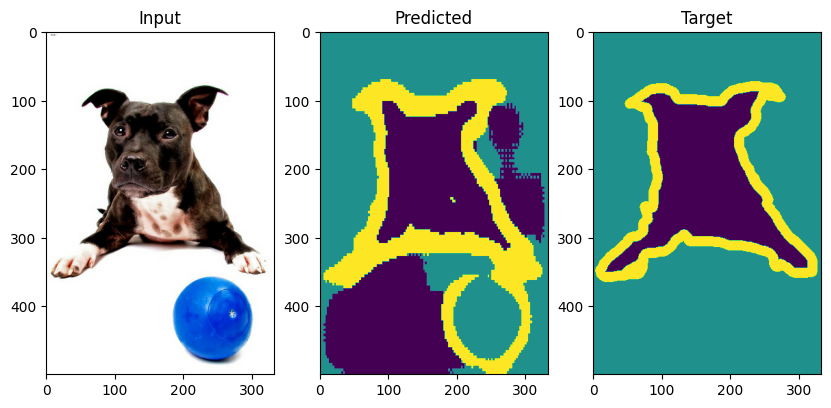

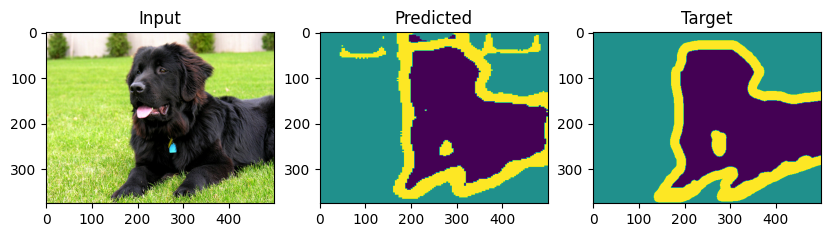

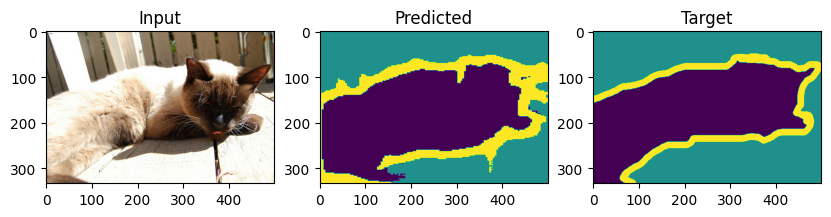

Epoch 1/10
184/184 [==============================] - 39s 212ms/step - loss: 0.1050 - io_u_2: 0.2821 - accuracy: 0.8015 - val_loss: 0.1099 - val_io_u_2: 0.2851 - val_accuracy: 0.7962
Epoch 2/10
184/184 [==============================] - 39s 213ms/step - loss: 0.1041 - io_u_2: 0.2822 - accuracy: 0.8034 - val_loss: 0.1115 - val_io_u_2: 0.2953 - val_accuracy: 0.7935
Epoch 3/10
184/184 [==============================] - 39s 211ms/step - loss: 0.1042 - io_u_2: 0.2840 - accuracy: 0.8035 - val_loss: 0.1104 - val_io_u_2: 0.2849 - val_accuracy: 0.7961
Epoch 4/10
184/184 [==============================] - 39s 212ms/step - loss: 0.1035 - io_u_2: 0.2830 - accuracy: 0.8042 - val_loss: 0.1072 - val_io_u_2: 0.2870 - val_accuracy: 0.8013
Epoch 5/10
184/184 [==============================] - 39s 212ms/step - loss: 0.1024 - io_u_2: 0.2829 - accuracy: 0.8064 - val_loss: 0.1111 - val_io_u_2: 0.2903 - val_accuracy: 0.7960
Epoch 6/10
184/184 [==============================] - 39s 211ms/step - loss: 0.1025 -

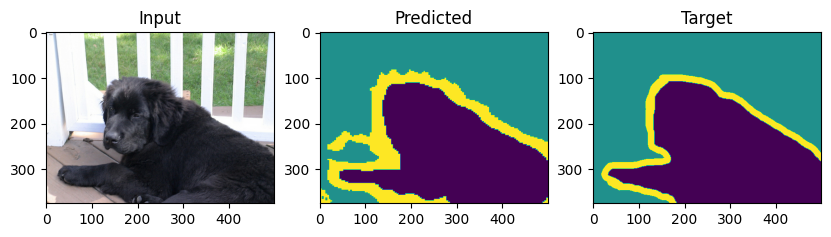

In [15]:
model_full = createModel(neuron_scale = 1)
train(model_full, 10)
test(model_full)
train(model_full, 10, False)
test(model_full)
train(model_full, 10, False)
test(model_full)
train(model_full, 10)
test(model_full)

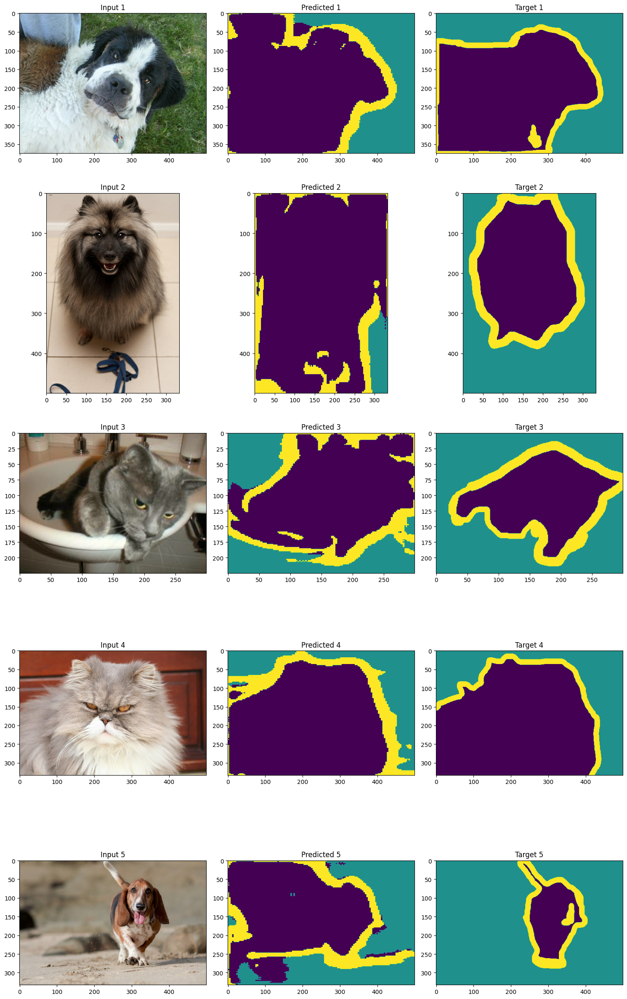

In [16]:
fullPredict(model_full)

Epoch 1/10


2024-05-22 11:53:44.044134: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:1021] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inu_net_model_3/UNet/block1_dropout1/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


184/184 [==============================] - 51s 216ms/step - loss: 0.2393 - io_u_3: 0.3853 - accuracy: 0.4749 - val_loss: 0.1992 - val_io_u_3: 0.3302 - val_accuracy: 0.5922
Epoch 2/10
184/184 [==============================] - 39s 214ms/step - loss: 0.1862 - io_u_3: 0.2980 - accuracy: 0.6177 - val_loss: 0.1735 - val_io_u_3: 0.2911 - val_accuracy: 0.6586
Epoch 3/10
184/184 [==============================] - 40s 215ms/step - loss: 0.1686 - io_u_3: 0.2792 - accuracy: 0.6640 - val_loss: 0.1625 - val_io_u_3: 0.2723 - val_accuracy: 0.6865
Epoch 4/10
184/184 [==============================] - 42s 228ms/step - loss: 0.1584 - io_u_3: 0.2791 - accuracy: 0.6874 - val_loss: 0.1536 - val_io_u_3: 0.2856 - val_accuracy: 0.7059
Epoch 5/10
184/184 [==============================] - 42s 227ms/step - loss: 0.1496 - io_u_3: 0.2794 - accuracy: 0.7062 - val_loss: 0.1479 - val_io_u_3: 0.2762 - val_accuracy: 0.7169
Epoch 6/10
184/184 [==============================] - 43s 234ms/step - loss: 0.1437 - io_u_3: 0.

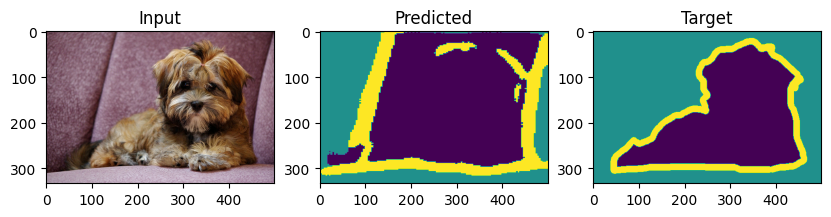

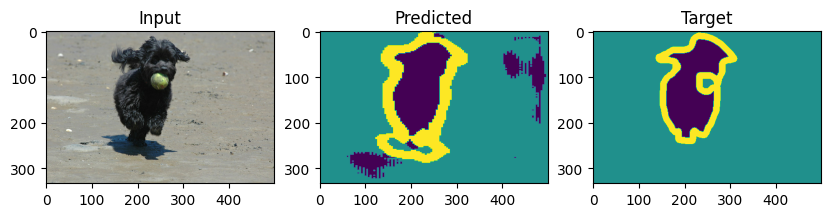

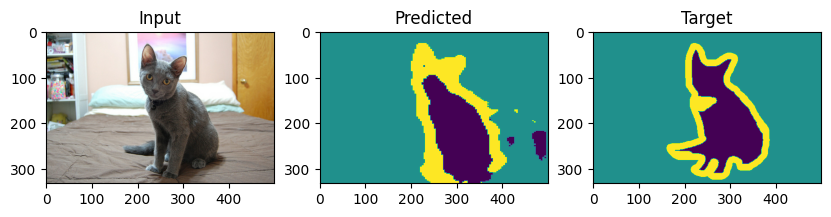

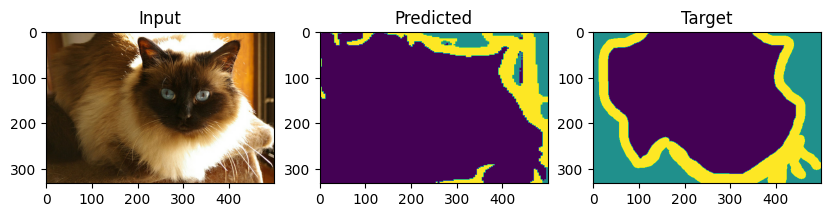

Epoch 1/10
184/184 [==============================] - 39s 211ms/step - loss: 0.0991 - io_u_3: 0.2834 - accuracy: 0.8135 - val_loss: 0.1072 - val_io_u_3: 0.2896 - val_accuracy: 0.8028
Epoch 2/10
184/184 [==============================] - 39s 210ms/step - loss: 0.0981 - io_u_3: 0.2848 - accuracy: 0.8145 - val_loss: 0.1047 - val_io_u_3: 0.2873 - val_accuracy: 0.8074
Epoch 3/10
184/184 [==============================] - 39s 211ms/step - loss: 0.0985 - io_u_3: 0.2844 - accuracy: 0.8140 - val_loss: 0.1049 - val_io_u_3: 0.2783 - val_accuracy: 0.8070
Epoch 4/10
184/184 [==============================] - 39s 213ms/step - loss: 0.0979 - io_u_3: 0.2842 - accuracy: 0.8151 - val_loss: 0.1053 - val_io_u_3: 0.2934 - val_accuracy: 0.8062
Epoch 5/10
184/184 [==============================] - 39s 213ms/step - loss: 0.0972 - io_u_3: 0.2840 - accuracy: 0.8168 - val_loss: 0.1051 - val_io_u_3: 0.2829 - val_accuracy: 0.8067
Epoch 6/10
184/184 [==============================] - 39s 214ms/step - loss: 0.0965 -

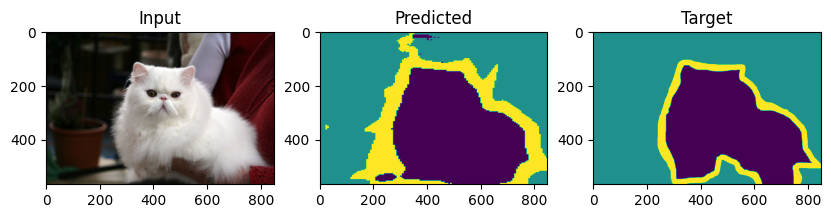

In [17]:
model_full_weirdkernel = createModel(neuron_scale = 1, last_kernel = (3, 3))
train(model_full_weirdkernel, 10)
test(model_full_weirdkernel)
train(model_full_weirdkernel, 10, False)
test(model_full_weirdkernel)
train(model_full_weirdkernel, 10, False)
test(model_full_weirdkernel)
train(model_full_weirdkernel, 10, False)
test(model_full_weirdkernel)
train(model_full_weirdkernel, 10)
test(model_full_weirdkernel)

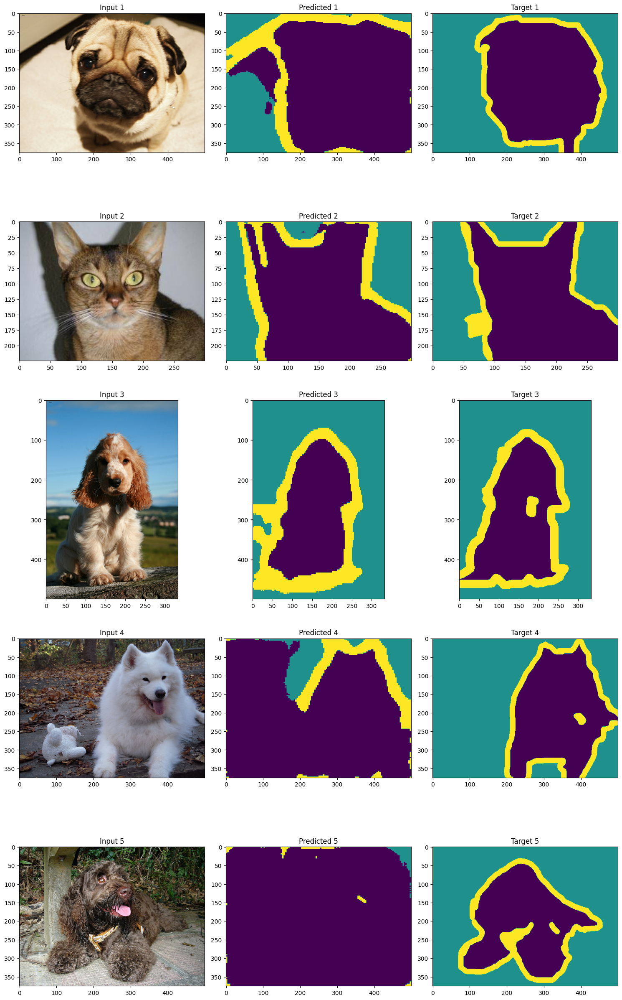

In [18]:
fullPredict(model_full_weirdkernel)

Epoch 1/10


2024-05-22 13:02:33.241331: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:1021] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inu_net_model/UNet/block1_dropout1/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9
2024-05-22 13:02:34.456822: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:467] Loaded cuDNN version 90100
2024-05-22 13:02:40.077243: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f3ee13e7b00 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-05-22 13:02:40.077298: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3050 Laptop GPU, Compute Capability 8.6
2024-05-22 13:02:40.102583: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env 

184/184 [==============================] - ETA: 0s - loss: 0.2558 - io_u: 0.3832 - accuracy: 0.4074

2024-05-22 13:03:59.980925: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:1021] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inu_net_model/UNet/block1_dropout1/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


184/184 [==============================] - 96s 323ms/step - loss: 0.2558 - io_u: 0.3832 - accuracy: 0.4074 - val_loss: 0.2256 - val_io_u: 0.3539 - val_accuracy: 0.5064
Epoch 2/10
184/184 [==============================] - 27s 149ms/step - loss: 0.2066 - io_u: 0.3251 - accuracy: 0.5533 - val_loss: 0.1965 - val_io_u: 0.3014 - val_accuracy: 0.5934
Epoch 3/10
184/184 [==============================] - 28s 150ms/step - loss: 0.1891 - io_u: 0.2915 - accuracy: 0.6052 - val_loss: 0.1822 - val_io_u: 0.2809 - val_accuracy: 0.6337
Epoch 4/10
184/184 [==============================] - 28s 152ms/step - loss: 0.1781 - io_u: 0.2779 - accuracy: 0.6364 - val_loss: 0.1775 - val_io_u: 0.2625 - val_accuracy: 0.6491
Epoch 5/10
184/184 [==============================] - 28s 153ms/step - loss: 0.1695 - io_u: 0.2748 - accuracy: 0.6595 - val_loss: 0.1659 - val_io_u: 0.2735 - val_accuracy: 0.6761
Epoch 6/10
184/184 [==============================] - 28s 152ms/step - loss: 0.1637 - io_u: 0.2749 - accuracy: 0.674

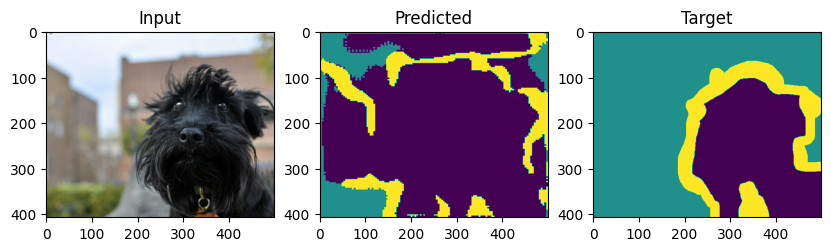

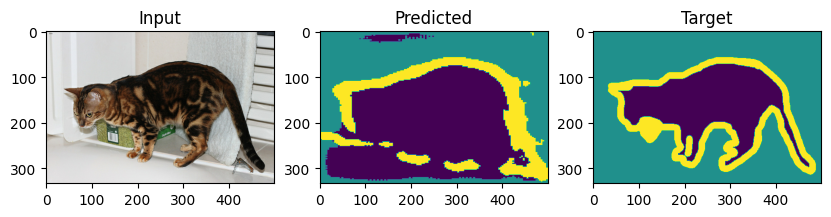

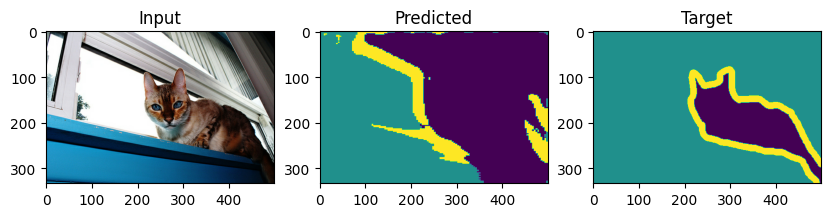

Epoch 1/10
184/184 [==============================] - 31s 166ms/step - loss: 0.1224 - io_u: 0.2849 - accuracy: 0.7670 - val_loss: 0.1252 - val_io_u: 0.2853 - val_accuracy: 0.7662
Epoch 2/10
184/184 [==============================] - 31s 166ms/step - loss: 0.1216 - io_u: 0.2838 - accuracy: 0.7678 - val_loss: 0.1250 - val_io_u: 0.2894 - val_accuracy: 0.7675
Epoch 3/10
184/184 [==============================] - 30s 166ms/step - loss: 0.1216 - io_u: 0.2843 - accuracy: 0.7682 - val_loss: 0.1246 - val_io_u: 0.2914 - val_accuracy: 0.7682
Epoch 4/10
184/184 [==============================] - 30s 166ms/step - loss: 0.1207 - io_u: 0.2840 - accuracy: 0.7701 - val_loss: 0.1221 - val_io_u: 0.2957 - val_accuracy: 0.7712
Epoch 5/10
184/184 [==============================] - 30s 166ms/step - loss: 0.1199 - io_u: 0.2862 - accuracy: 0.7705 - val_loss: 0.1235 - val_io_u: 0.2862 - val_accuracy: 0.7692
Epoch 6/10
184/184 [==============================] - 31s 166ms/step - loss: 0.1198 - io_u: 0.2842 - accu

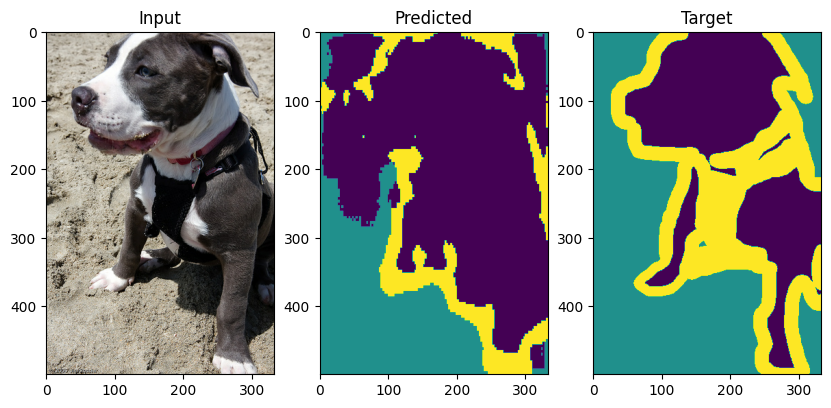

In [10]:
model_half = createModel(neuron_scale = 0.5)
train(model_half, 10)
test(model_half)
train(model_half, 10, False)
test(model_half)
train(model_half, 10, False)
test(model_half)
train(model_half, 10)
test(model_half)

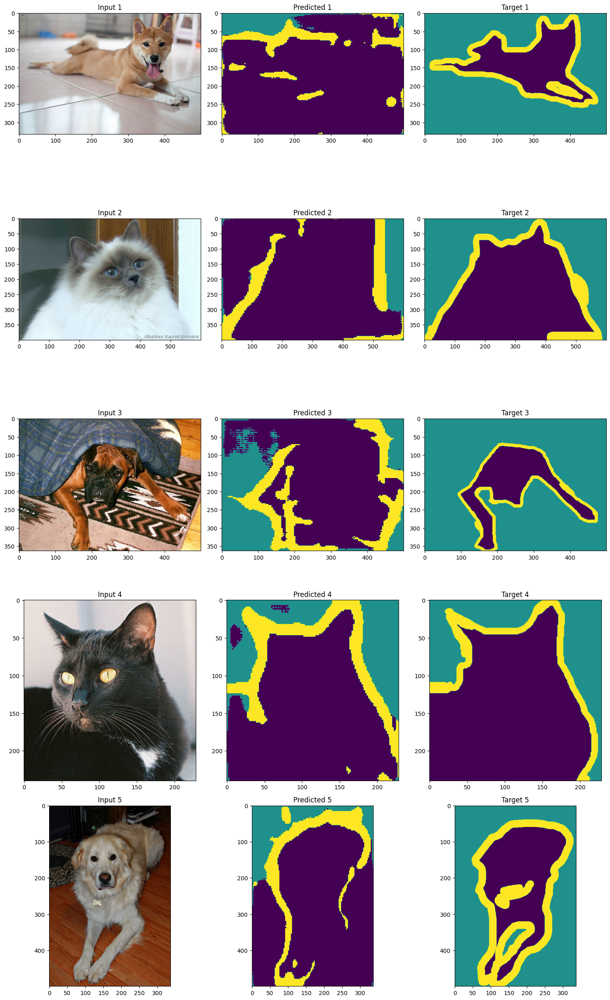

In [11]:
fullPredict(model_half)

Epoch 1/10


2024-05-22 13:23:29.781431: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:1021] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inu_net_model_1/UNet/block1_dropout1/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


184/184 [==============================] - 43s 174ms/step - loss: 0.2562 - io_u_1: 0.4591 - accuracy: 0.4107 - val_loss: 0.2302 - val_io_u_1: 0.3888 - val_accuracy: 0.4855
Epoch 2/10
184/184 [==============================] - 31s 170ms/step - loss: 0.2094 - io_u_1: 0.3291 - accuracy: 0.5373 - val_loss: 0.2027 - val_io_u_1: 0.3071 - val_accuracy: 0.5721
Epoch 3/10
184/184 [==============================] - 31s 170ms/step - loss: 0.1935 - io_u_1: 0.3053 - accuracy: 0.5897 - val_loss: 0.1910 - val_io_u_1: 0.2959 - val_accuracy: 0.6111
Epoch 4/10
184/184 [==============================] - 32s 172ms/step - loss: 0.1838 - io_u_1: 0.2896 - accuracy: 0.6187 - val_loss: 0.1801 - val_io_u_1: 0.2883 - val_accuracy: 0.6410
Epoch 5/10
184/184 [==============================] - 31s 169ms/step - loss: 0.1759 - io_u_1: 0.2802 - accuracy: 0.6420 - val_loss: 0.1720 - val_io_u_1: 0.2750 - val_accuracy: 0.6620
Epoch 6/10
184/184 [==============================] - 31s 167ms/step - loss: 0.1690 - io_u_1: 0.

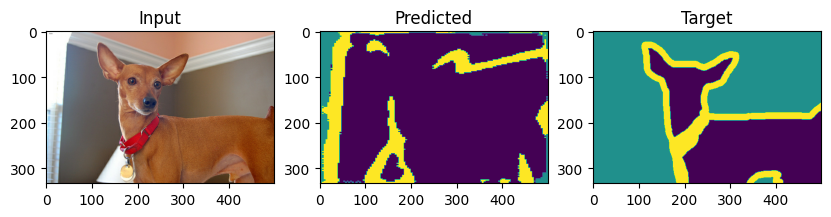

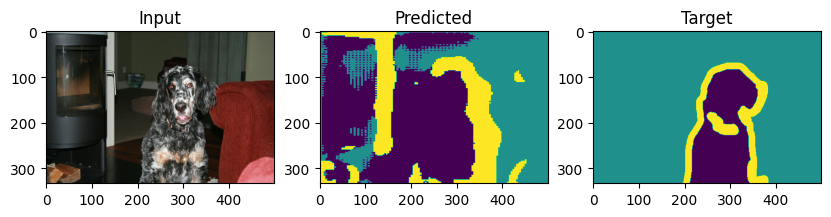

2024-05-22 13:39:26.659932: W tensorflow/core/kernels/data/prefetch_autotuner.cc:52] Prefetch autotuner tried to allocate 868059 bytes after encountering the first element of size 868059 bytes.This already causes the autotune ram budget to be exceeded. To stay within the ram budget, either increase the ram budget or reduce element size


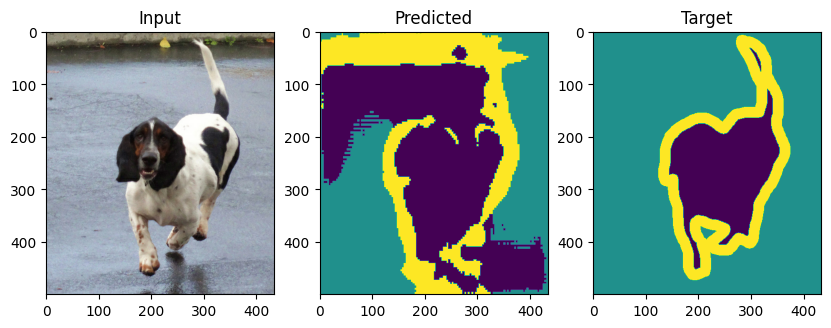

Epoch 1/10
184/184 [==============================] - 30s 163ms/step - loss: 0.1258 - io_u_1: 0.2846 - accuracy: 0.7588 - val_loss: 0.1280 - val_io_u_1: 0.2927 - val_accuracy: 0.7590
Epoch 2/10
184/184 [==============================] - 30s 162ms/step - loss: 0.1258 - io_u_1: 0.2846 - accuracy: 0.7589 - val_loss: 0.1290 - val_io_u_1: 0.2924 - val_accuracy: 0.7568
Epoch 3/10
184/184 [==============================] - 30s 162ms/step - loss: 0.1251 - io_u_1: 0.2858 - accuracy: 0.7598 - val_loss: 0.1286 - val_io_u_1: 0.2922 - val_accuracy: 0.7576
Epoch 4/10
184/184 [==============================] - 30s 163ms/step - loss: 0.1246 - io_u_1: 0.2831 - accuracy: 0.7616 - val_loss: 0.1283 - val_io_u_1: 0.2940 - val_accuracy: 0.7587
Epoch 5/10
184/184 [==============================] - 30s 163ms/step - loss: 0.1243 - io_u_1: 0.2855 - accuracy: 0.7619 - val_loss: 0.1287 - val_io_u_1: 0.2945 - val_accuracy: 0.7577
Epoch 6/10
184/184 [==============================] - 30s 164ms/step - loss: 0.1237 -

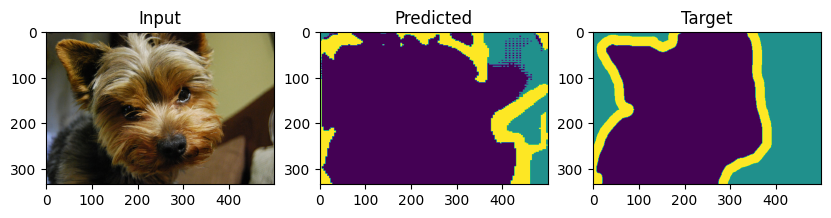

In [12]:
model_half_weirdkernel = createModel(neuron_scale = 0.5, last_kernel = (3, 3))
train(model_half_weirdkernel, 10)
test(model_half_weirdkernel)
train(model_half_weirdkernel, 10, False)
test(model_half_weirdkernel)
train(model_half_weirdkernel, 10, False)
test(model_half_weirdkernel)
train(model_half_weirdkernel, 10)
test(model_half_weirdkernel)

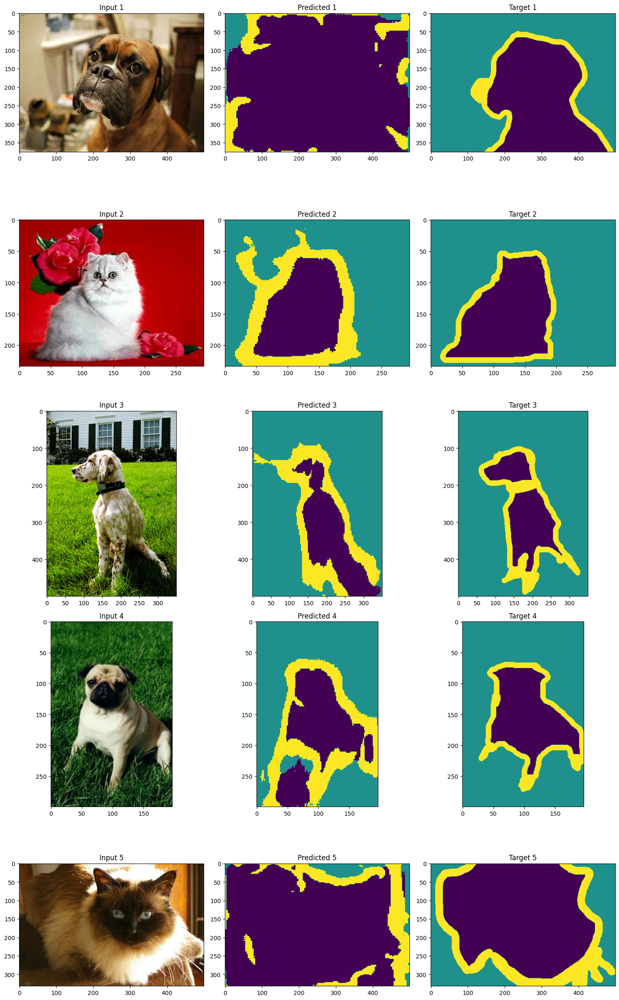

In [13]:
fullPredict(model_half_weirdkernel)